In [ ]:
!pip install bing-image-downloader

In [ ]:
!mkdir images

In [ ]:
from bing_image_downloader import downloader
downloader.download("grizzly bear", limit=5,  output_dir='images', adult_filter_off=True, force_replace=False)

[%] Downloading Images to /content/images/grizzly bear


[!!]Indexing page: 1

[%] Indexed 20 Images on Page 1.


[%] Downloading Image #1 from https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg
[Error]Invalid image, not saving https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg

[!] Issue getting: https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg
[!] Error:: Invalid image, not saving https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg

[%] Downloading Image #1 from https://thelatebloomerhiker.files.wordpress.com/2014/11/grizzly-bear-22224-1920x1200.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://wallsdesk.com/wp-content/uploads/2017/01/Grizzly-Bear-full-HD.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://www.wildnatureimages.com/images/xl/160623-054-Brown-Bear-Cubs.jpg
[%] File Downloaded !

[%] 

In [ ]:
from fastai.vision.all import *

dir_images = 'images/grizzly bear'
im = Image.open(dir_images+'/Image_1.jpg')

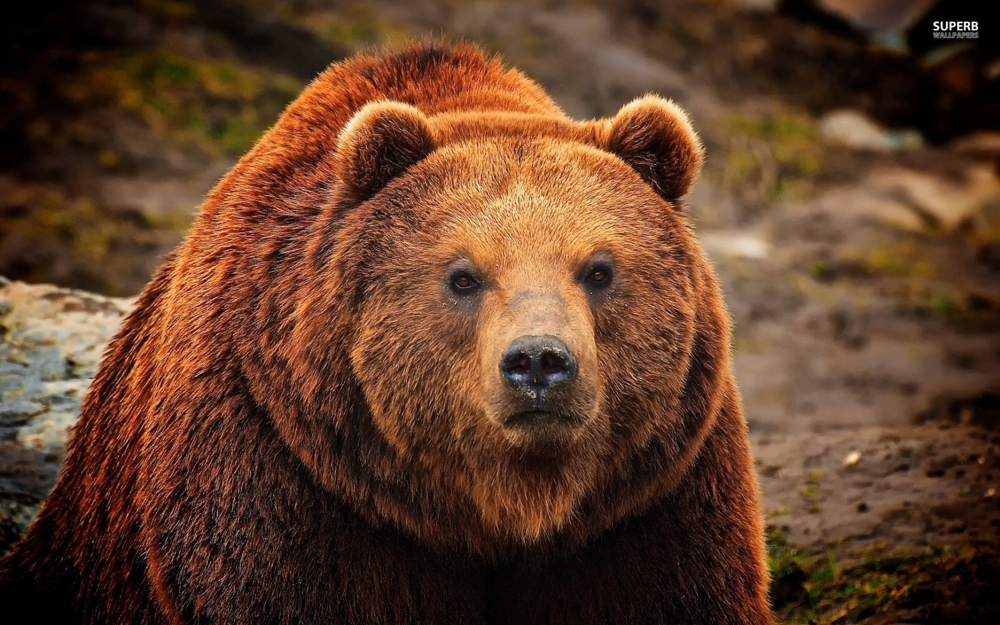

In [ ]:
im

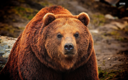

In [ ]:
im.to_thumb(128,128)

In [ ]:
# Define the bear types
bear_types = ['grizzly', 'black', 'teddy']

# Define the main directory
path = Path('bears')

# Create the main directory if it doesn't exist
path.mkdir(exist_ok=True)

for bear in bear_types:
    dest = path

    downloader.download(
        f"{bear} bear",
        limit=100,
        output_dir=str(dest),
        adult_filter_off=True,
        force_replace=False
    )

print("Image download complete!")

[%] Downloading Images to /content/bears/grizzly bear


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg
[Error]Invalid image, not saving https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg

[!] Issue getting: https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg
[!] Error:: Invalid image, not saving https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg

[%] Downloading Image #1 from https://thelatebloomerhiker.files.wordpress.com/2014/11/grizzly-bear-22224-1920x1200.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://wallsdesk.com/wp-content/uploads/2017/01/Grizzly-Bear-full-HD.jpg
[%] File Downloaded !

[%] Downloading Image #3 from http://4.bp.blogspot.com/-3WcCGQ1bzJI/UXcshw5QEwI/AAAAAAAAIns/gfJpUVE0FK8/s1600/Grizzly-Bear-7.jpg
[%]

In [ ]:
from pathlib import Path

### refine the files and names of the directories

path = "/content/bears/"

## change the name of the directories
for o in bear_types:
  try:
    os.rename(path + f"{o} bear", path + f"{o}")
  except:
    pass

In [ ]:
## change the name of the each file

for o in bear_types:
  dir_path = Path(path + f"{o}")

  if dir_path.exists() and dir_path.is_dir():
        for i, file in enumerate(dir_path.iterdir(), start=1):
            new_name = dir_path / f"{o}_{i}{file.suffix}"
            file.rename(new_name)
            print(f"Renamed {file} to {new_name}")
  else:
      print(f"The directory {dir_path} does not exist or is not a directory.")

Renamed /content/bears/grizzly/Image_41.jpg to /content/bears/grizzly/grizzly_1.jpg
Renamed /content/bears/grizzly/Image_83.jpg to /content/bears/grizzly/grizzly_2.jpg
Renamed /content/bears/grizzly/Image_77.jpg to /content/bears/grizzly/grizzly_3.jpg
Renamed /content/bears/grizzly/Image_95.jpg to /content/bears/grizzly/grizzly_4.jpg
Renamed /content/bears/grizzly/Image_90.jpg to /content/bears/grizzly/grizzly_5.jpg
Renamed /content/bears/grizzly/Image_42.jpg to /content/bears/grizzly/grizzly_6.jpg
Renamed /content/bears/grizzly/Image_91.jpg to /content/bears/grizzly/grizzly_7.jpg
Renamed /content/bears/grizzly/Image_88.jpg to /content/bears/grizzly/grizzly_8.jpg
Renamed /content/bears/grizzly/Image_32.jpg to /content/bears/grizzly/grizzly_9.jpg
Renamed /content/bears/grizzly/Image_33.jpg to /content/bears/grizzly/grizzly_10.jpg
Renamed /content/bears/grizzly/Image_36.jpg to /content/bears/grizzly/grizzly_11.jpg
Renamed /content/bears/grizzly/Image_52.jpg to /content/bears/grizzly/griz

In [ ]:
fns = get_image_files(path)
fns

(#299) [Path('/content/bears/grizzly/grizzly_58.jpg'),Path('/content/bears/grizzly/grizzly_98.jpg'),Path('/content/bears/grizzly/grizzly_18.jpg'),Path('/content/bears/grizzly/grizzly_15.jpg'),Path('/content/bears/grizzly/grizzly_71.jpg'),Path('/content/bears/grizzly/grizzly_12.jpg'),Path('/content/bears/grizzly/grizzly_40.jpg'),Path('/content/bears/grizzly/grizzly_66.jpg'),Path('/content/bears/grizzly/grizzly_34.jpg'),Path('/content/bears/grizzly/grizzly_73.jpeg')...]

In [ ]:
failed = verify_images(fns)

In [ ]:
failed

(#0) []

In [ ]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [ ]:
dls = bears.dataloaders(path)

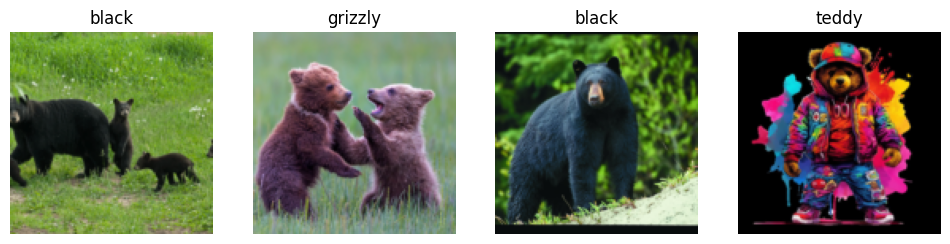

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

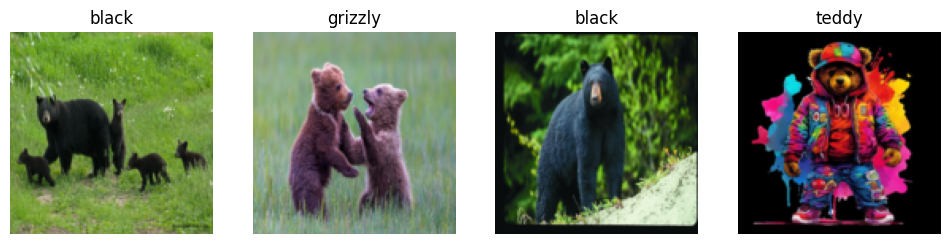

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

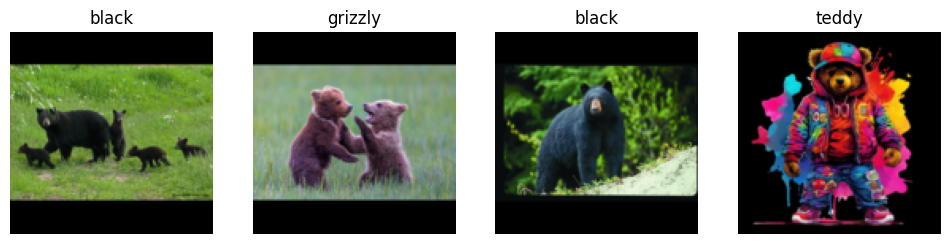

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

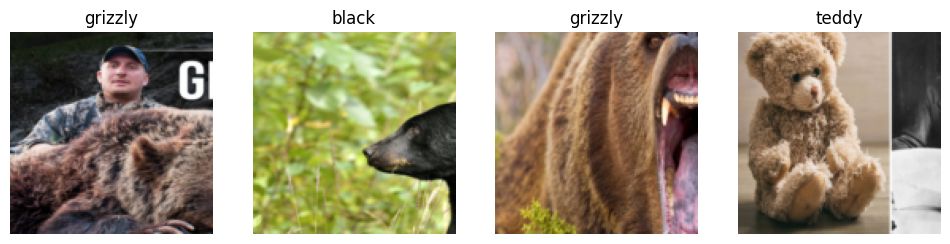

In [ ]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1)

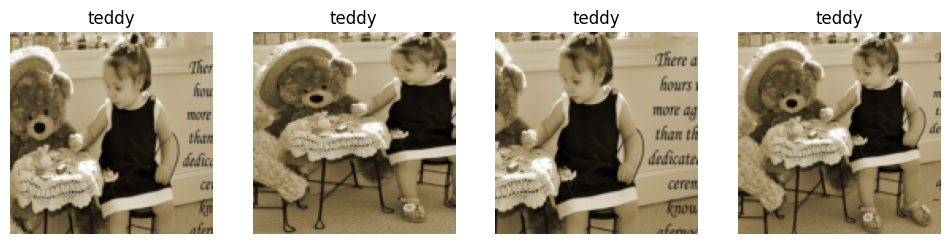

In [ ]:
dls.train.show_batch(max_n=4, nrows=1, unique=True)

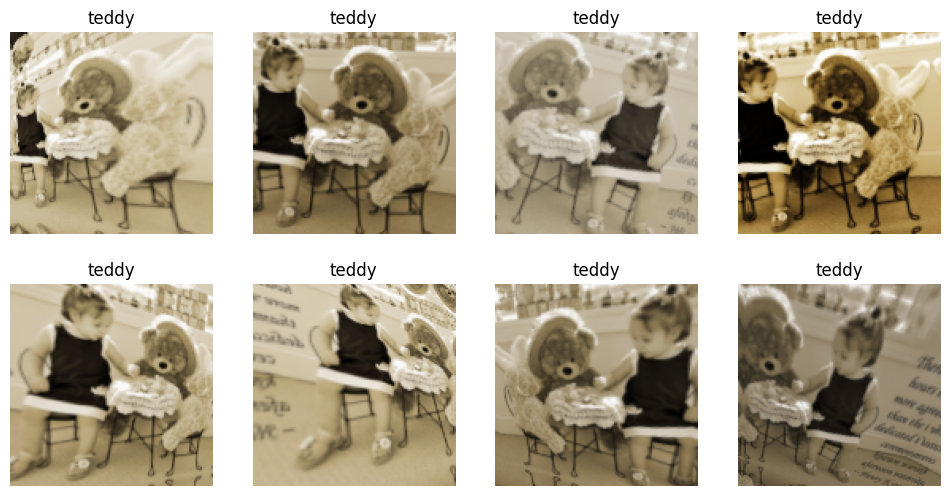

In [ ]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [ ]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)
dls = bears.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:303: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")


epoch,train_loss,valid_loss,error_rate,time
0,1.405206,0.363836,0.157895,01:15


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.383199,0.176809,0.052632,01:22
1,0.283575,0.107648,0.035088,01:27
2,0.223290,0.076677,0.035088,01:24
3,0.208656,0.070050,0.017544,01:18


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


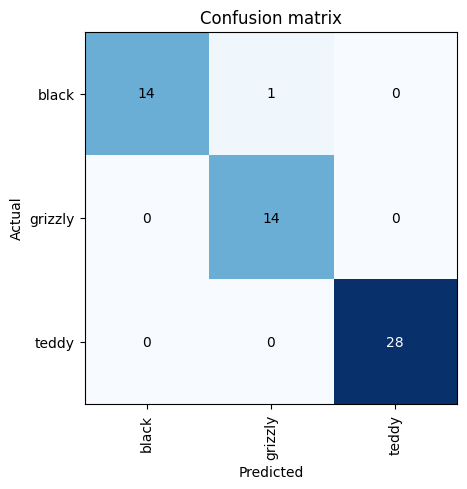

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
# Access the confusion matrix and calculate accuracy manually
correct, total = interp.confusion_matrix().trace(), interp.confusion_matrix().sum()
accuracy = correct / total
print(f'Accuracy: {accuracy}')

Accuracy: 0.9824561403508771


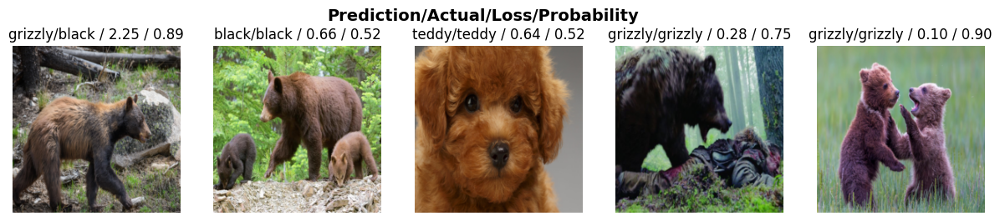

In [ ]:
interp.plot_top_losses(5, nrows=1)

In [ ]:
from fastai.vision.widgets import ImageClassifierCleaner

cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
cleaner.delete()

(#11) [1,2,4,7,10,12,18,20,24,27...]

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
### if they are in the different category we should move the files into another directory
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
#### create an inference / to use a model to get the predictions

learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('/content/bears/grizzly/grizzly_10.jpg')

('grizzly', tensor(1), tensor([4.8616e-04, 9.9882e-01, 6.9178e-04]))

In [ ]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [ ]:
!pip install ipywidgets
import ipywidgets as widgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.1 MB/s eta 0:00:00


In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
img = PILImage.create(btn_upload.data[-1])

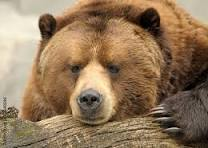

In [ ]:
img

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)

In [ ]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [ ]:
from ipywidgets import VBox, widgets

In [ ]:
lbl_pred = widgets.Label()

In [ ]:
def on_click_classify(change):
 img = PILImage.create(btn_upload.data[-1])
 out_pl.clear_output()
 with out_pl: display(img.to_thumb(128,128))
 pred,pred_idx,probs = learn_inf.predict(img)
 lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
btn_run.on_click(on_click_classify)

In [ ]:
VBox([widgets.Label('Select your bear!'),
 btn_upload, btn_run, out_pl, lbl_pred])